In [1]:
# Parameters
notebook_fname = "NN_full_v3_BO_test_0"
data_path = '../01_Dataset_Cleaned/'
model_path = '../04_Model_Saved/'

# Development mode
# Enable automatic reloading of modules when code is changed.
%load_ext autoreload

# Set autoreload mode to automatically reload all modules imported with %aimport.
%autoreload 2


# main notebook to train and evaluate the machine learning model


In [2]:
import os
import sys
sys.path.append("..")
sys.path.append("../..")

current_directory = os.getcwd()
print("Current directory:", current_directory)

Current directory: /nethome/home3/yuxiang.wu/v6_A-B-C-D-E_Sputtering/CCA_CALPHAD_SSS_ML/CCA_representation_ML/03_Model_Train_Evaluate_Predict


In [3]:
# basic machine learning libaries
import os
from sklearn.model_selection import RepeatedKFold, RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
from sklearn.metrics import r2_score
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Tensorflow
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras import layers
from keras.layers import Dense, Concatenate, Dropout, BatchNormalization
from keras.utils.vis_utils import plot_model

# Data processing and plotting
import numpy as np
from numpy import asarray
import pandas as pd
import scipy as sp
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.pyplot import figure
from tabulate import tabulate

# Bayesian Optimization
import GPyOpt

# Parellisation
from multiprocessing import Pool
from joblib import Parallel, delayed
import concurrent.futures

# Miscellaneous
import importlib
import pickle
import time
import warnings
warnings.filterwarnings("ignore")

print(f'cpu_count: {os.cpu_count()}')

# Data Path
if os.path.isfile(data_path+'LiteratureDataset_Corrosion_YW_v3_processed.xlsx'):
    print(f"Folder '{os.path.abspath(data_path)}' found.")
else:
    print(f"Warning: File '{data_path}' not found!")

# Setting up multiple path for parallel Bayesian Optimization
num_str = notebook_fname.split("_")[-1]  # get the last string after "_"

try:
    bo_ens_num = int(num_str)
    print(f"bo_ens_num: {bo_ens_num}")
except ValueError:
    # if the string can't be converted to an integer, keep it as a string
    bo_ens_num = int(123)
    print(f"book master - bo_ens_num: {bo_ens_num}")

# model path
model_path_bo = f'{model_path}{notebook_fname}/'

if not os.path.exists(model_path_bo):
    os.makedirs(model_path_bo)
    print(f"Folder '{os.path.abspath(model_path_bo)}' created.")
else:
    print(f"Folder '{os.path.abspath(model_path_bo)}' already exists.")

# Cleaning up previous tensorflow sessions
tf.keras.backend.clear_session()

2023-08-24 10:08:24.847716: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## functionality control


In [ ]:
# functionality control of the notebook
Flag_Preprocessing = True
Flag_Training_try = False
Flag_BO_search = False
Flag_Training_BO_best = True
Flag_Evaluation = True
Flag_Prediction = True

# Use GPU or not
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
print('not using GPU')

not using GPU


## Import hardness and corrosion dataset


In [ ]:
# Declare column names for the chemical composition dataframe, specific testing conditions, selected features, and output for Hardness and Corrosion datasets.
compo_column = ['Fe', 'Cr', 'Ni', 'Mo', 'W', 'N', 'Nb', 'C', 'Si',
                'Mn', 'Cu', 'Al', 'V', 'Ta', 'Ti', 'Co', 'Mg', 'Y', 'Zr', 'Hf']
C_specific_testing_column = ['TestTemperature_C',
                             'ChlorideIonConcentration', 'pH', 'ScanRate_mVs']
specific_features_sel_column = ['delta_a', 'Tm', 'sigma_Tm',
                                'Hmix', 'sigma_Hmix', 'sigma_elec_nega', 'VEC', 'sigma_VEC']
H_output_column = ['converted HV']
C_output_column = ['AvgPittingPotential_mV']

# Load the Hardness and Corrosion datasets
df_H = pd.read_excel(
    data_path + 'LiteratureDataset_Hardness_YW_v3_processed.xlsx')
df_C = pd.read_excel(
    data_path + 'LiteratureDataset_Corrosion_YW_v3_processed.xlsx')

# Partition the datasets into component composition, specific features, and output data
df_H_compo, df_H_specific_features, df_H_output = df_H[compo_column], df_H[
    specific_features_sel_column], df_H[H_output_column]
(df_C_compo, df_C_specific_testing, df_C_specific_features,
 df_C_output) = df_C[compo_column], df_C[C_specific_testing_column], df_C[specific_features_sel_column], df_C[C_output_column]

df_H_compo_specific_features = pd.concat(
    [df_H_compo, df_H_specific_features], axis=1)
df_C_compo_specific_features = pd.concat(
    [df_C_compo, df_C_specific_features], axis=1)

## Data preprocessing

**hardness network**

- input (X1): df_H_compo
- input (Y1):
- input (V1): df_H_specific_features
- output(H1): df_H_output

**corrosion network**

- input (X2): df_C_compo
- input (Z2): df_C_specific_testing
- input (W2): df_C_specific_features
- output(C2): df_C_output

### Obtain the MinMaxScaler from normalisation


In [ ]:
if Flag_Preprocessing:

    # create an empty dataframe
    df_H_specific_testing = pd.DataFrame()

    # Prepare data for NN
    dfs = [df_H_compo, df_H_specific_testing, df_H_specific_features, df_H_output,
           df_C_compo, df_C_specific_testing, df_C_specific_features, df_C_output]

    # Convert DataFrames to numpy arrays
    inputs_outputs = [np.asarray(df.values) for df in dfs]

    # Define each variable
    (X1, Y1, V1, H1,
     X2, Z2, W2, C2) = inputs_outputs

    # Initialize MinMaxScalers for each data set
    scalers = {
        "compo": MinMaxScaler(),
        "H_specific_testing": MinMaxScaler(),
        "C_specific_testing": MinMaxScaler(),
        "specific_features": MinMaxScaler(),
        "H_output": MinMaxScaler(),
        "C_output": MinMaxScaler()
    }

    # Fit scalers to appropriate data
    scalers["compo"].fit(np.concatenate((X1, X2)))
    if Y1.size != 0:  # if Y1 is empty
        scalers["H_specific_testing"].fit(Y1)
    scalers["C_specific_testing"].fit(Z2)
    scalers["specific_features"].fit(np.concatenate((V1, W2)))
    scalers["H_output"].fit(H1.reshape((-1, 1)))
    scalers["C_output"].fit(C2.reshape((-1, 1)))

    print(scalers)

    # Save the scalers dictionary to a file using pickle
    with open(data_path + 'scalers.pkl', 'wb') as f:
        pickle.dump(scalers, f)

{'compo': MinMaxScaler(), 'H_specific_testing': MinMaxScaler(), 'C_specific_testing': MinMaxScaler(), 'specific_features': MinMaxScaler(), 'H_output': MinMaxScaler(), 'C_output': MinMaxScaler()}


In [ ]:
print(scalers["H_output"].fit(H1.reshape((-1, 1))))

MinMaxScaler()


### RepeatedKFold train-test split

- for hardness: `kfold_with_norm_H`

  - `X1_train_KFold`, `X1_test_KFold`,
  - (empty array)
  - `V1_train_KFold`, `V1_test_KFold`,
  - `H1_train_KFold`, `H1_test_KFold` as lists used in model training

- for corrosion: `kfold_with_norm_C`
  - `X2_train_KFold`, `X2_test_KFold`,
  - `Z2_train_KFold`, `Z2_test_KFold`,
  - `W2_train_KFold`, `W2_test_KFold`,
  - `C2_train_KFold`, `C2_test_KFold` as lists used in model training


In [ ]:
if Flag_Preprocessing:

    from utils.preprocessing_kfold_norm import kfold_with_norm_H, kfold_with_norm_C

    n_splits, n_repeats, random_state = 6, 2, 42

    # for hardness network
    ([X1_train_KFold, V1_train_KFold, H1_train_KFold],
     [X1_test_KFold, V1_test_KFold, H1_test_KFold],
     [X1_train_norm_KFold, V1_train_norm_KFold, H1_train_norm_KFold],
     [X1_test_norm_KFold, V1_test_norm_KFold, H1_test_norm_KFold]) = kfold_with_norm_H(X1, V1, H1,
                                                                                       scalers["compo"], scalers[
                                                                                           "specific_features"], scalers["H_output"],
                                                                                       n_splits, n_repeats, random_state)

    # for corrosion network
    ([X2_train_KFold, Z2_train_KFold, W2_train_KFold, C2_train_KFold],
     [X2_test_KFold, Z2_test_KFold, W2_test_KFold, C2_test_KFold],
     [X2_train_norm_KFold, Z2_train_norm_KFold,
        W2_train_norm_KFold, C2_train_norm_KFold],
     [X2_test_norm_KFold, Z2_test_norm_KFold, W2_test_norm_KFold, C2_test_norm_KFold]) = kfold_with_norm_C(X2, Z2, W2, C2,
                                                                                                           scalers["compo"], scalers["C_specific_testing"], scalers[
                                                                                                               "specific_features"], scalers["C_output"],
                                                                                                           n_splits, n_repeats, random_state)

### Plot the histogram of train/test data for each split

- Plotting hardness train/test datasets
- Plotting corrosion train/test datasets


In [ ]:
# if Flag_Preprocessing:

#     from utils.preprocessing_kfold_norm import plot_hist_kfold_with_norm

#     # call the function to plot the histograms - hardness network
#     plot_hist_kfold_with_norm(train_data=(X1_train_norm_KFold, V1_train_norm_KFold, H1_train_norm_KFold),
#                               test_data=(X1_test_norm_KFold,
#                                          V1_test_norm_KFold,  H1_test_norm_KFold),
#                               x_min=(0, 0, 0),
#                               x_max=(0.2, 1, 1),
#                               axs_title='Hardness network Train/Test Data',
#                               n_splits=6, n_repeats=1, nrows=3, dataset='H')

#     # call the function to plot the histograms - corrosion network
#     plot_hist_kfold_with_norm(train_data=(X2_train_norm_KFold, Z2_train_norm_KFold, W2_train_norm_KFold, C2_train_norm_KFold),
#                               test_data=(X2_test_norm_KFold,  Z2_test_norm_KFold,
#                                          W2_test_norm_KFold, C2_test_norm_KFold),
#                               x_min=(0, 0, 0, 0),
#                               x_max=(0.2, 1, 1, 1),
#                               axs_title='Corrosion network Train/Test Data',
#                               n_splits=6, n_repeats=1, nrows=4, dataset='C')

## NN architecture, creation, evaluation:

- shared feature NN: NNF
- hardness NN: NNH
- corrosion NN: NNC

class: `MultiTaskNN`

```
       input2-->|
                |-->NNH-->output_H
                |
 input1-->NNF-->|
                |
                |-->NNC-->output_C
       input3-->|
```


### Using `MultiTaskNN` class for training


In [ ]:
if Flag_Training_try:

    from utils.multitask_nn import MultiTaskNN

    start_time = time.time()
    mt_nn = MultiTaskNN(NNF_num_nodes=256, NNF_num_layers=1,
                        NNH_num_nodes=64, NNH_num_layers=4,
                        NNC_num_nodes=64, NNC_num_layers=3,
                        mc_state=True, act='relu',
                        NNF_dropout=0.25, NNH_dropout=0.25, NNC_dropout=0.25,
                        loss_func=tf.keras.metrics.mean_squared_error,
                        learning_rate_H=0.001, learning_rate_C=0.001,
                        batch_size_H=32,
                        N_epochs_local=1, total_epochs=1000,
                        model_save_flag=True, model_path_bo=model_path_bo)

    # inputs for `RepeatedKFold`
    k_folds, n_CVrepeats = 6, 2

    # train_loss/val_loss: training/validation loss history
    # score_loss/score_r2: evaluated loss score/R2 score

    (train_loss_H, train_loss_C,
     val_loss_H,    val_loss_C,
     score_loss_H,  score_loss_C,
     score_r2_H,    score_r2_C) = mt_nn.evaluate_NN_full_model(X1_train_norm_KFold, X1_test_norm_KFold, V1_train_norm_KFold, V1_test_norm_KFold, H1_train_norm_KFold, H1_test_norm_KFold,
                                                               X2_train_norm_KFold, X2_test_norm_KFold, Z2_train_norm_KFold, Z2_test_norm_KFold, W2_train_norm_KFold, W2_test_norm_KFold, C2_train_norm_KFold, C2_test_norm_KFold,
                                                               k_folds, n_CVrepeats)
    elapsed_time = time.time() - start_time
    print("Time taken: ", int(elapsed_time), "seconds")

### Training quality for NNH_model and NNC_model


In [ ]:
if Flag_Training_try:
    # training results by score_loss
    # print([f'{x:.4f}' for x in score_loss_H])
    # print([f'{x:.4f}' for i in range(12) for x in val_loss_H[i][-1]])
    print(
        f"score_loss_H: {np.mean(score_loss_H):.4f} ({np.std(score_loss_H):.4f})")

    # print([f'{x:.4f}' for x in score_loss_C])
    # print([f'{x:.4f}' for i in range(12) for x in val_loss_C[i][-1]])
    print(
        f"score_loss_C: {np.mean(score_loss_C):.4f} ({np.std(score_loss_C):.4f})")

    # training results by score_r2
    # print([f'{x:.4f}' for x in score_r2_H])
    print(
        f"score_r2_H:   {np.mean(score_r2_H):.4f} ({np.std(score_r2_H):.4f})")

    # print([f'{x:.4f}' for x in score_r2_C])
    print(f"score_r2_C: {np.mean(score_r2_C):.4f} ({np.std(score_r2_C):.4f})")

    print(f"score_r2_HC: {np.mean([score_r2_H, score_r2_C]):.4f}")

### Plot the loss history


In [ ]:
if Flag_Training_try:
    mt_nn.plot_losses(train_loss_H, val_loss_H, train_loss_C,
                      val_loss_C, k_folds=6, n_CVrepeats=2)

## Bayesian Hyperparameter Optimisation

class: `BO_hyper_objective`


### Define the search domain


In [ ]:
if Flag_BO_search:
    # Define the search space for hyperparameters

    # loss_encoder == 0: mean_squared_error
    # loss_encoder == 1: mean_absolute_error

    search_hyper_space = [{'name': 'NNF_num_nodes',   'type': 'discrete',  'domain': (32, 64, 128, 256)},  # 0: NNF_num_nodes
                          {'name': 'NNF_num_layers',  'type': 'discrete',
                           'domain': (1, 2, 3, 4, 5)},  # 1: NNF_num_layers
                          {'name': 'NNH_num_nodes',   'type': 'discrete',
                           'domain': (32, 64, 128)},    # 2: NNH_num_nodes
                          {'name': 'NNH_num_layers',  'type': 'discrete',
                           'domain': (1, 2, 3)},        # 3: NNH_num_layers
                          {'name': 'NNC_num_nodes',   'type': 'discrete',
                           'domain': (32, 64, 128)},    # 4: NNC_num_nodes
                          {'name': 'NNC_num_layers',  'type': 'discrete',
                           'domain': (1, 2, 3)},        # 5: NNC_num_layers
                          {'name': 'learning_rate_H', 'type': 'continuous',
                           'domain': (0.0001, 0.0005)},    # 9: learning_rate_H
                          {'name': 'learning_rate_C', 'type': 'continuous',
                           'domain': (0.0001, 0.0005)},    # 10: learning_rate_C
                          {'name': 'batch_size_H',    'type': 'discrete',
                           'domain': (16, 32, 64)},        # 11: batch_size_H
                          {'name': 'N_epochs_local',  'type': 'discrete',  'domain': (1, 2, 3)}]  # 12: N_epochs_global

    fixed_hyper_space = [{'name': 'NNF_dropout',     'type': 'continuous',
                          'domain': (0.1)},            # 6: NNF_dropout
                         {'name': 'NNH_NNC_dropout', 'type': 'continuous',
                          'domain': (0.1)},            # 7: NNH_NNC_dropout
                         {'name': 'loss_encoder',      'type': 'discrete',
                          'domain': (0)}]               # 8: loss_encoder

    search_hyper_names = [entry['name'] for entry in search_hyper_space]
    fixed_hyper_names = [entry['name'] for entry in fixed_hyper_space]
    all_hyper_names = ['NNF_num_nodes', 'NNF_num_layers', 'NNH_num_nodes', 'NNH_num_layers', 'NNC_num_nodes', 'NNC_num_layers',
                       'NNF_dropout', 'NNH_NNC_dropout',  'loss_encoder', 'learning_rate_H',  'learning_rate_C',   'batch_size_H', 'N_epochs_local']

### BO hyperparameter optimisation


In [ ]:
if Flag_BO_search:
    from utils.BO_hyper_objective import BayesianOptimizationObjective

    start_time = time.time()

    # Set up the optimizer
    bo = None
    bo_iteration = 0
    np.random.seed(bo_ens_num)

    # Configuration settings for the model being optimized
    total_epochs = 1000
    n_initial_points, n_iterations = 10, 200

    mc_state, act = True, 'relu'
    model_save_flag = False
    k_folds, n_CVrepeats = 6, 2
    score_r2_HC_list, score_loss_HC_list, score_r2_H_list, score_r2_C_list, score_loss_H_list, score_loss_C_list = [], [], [], [], [], []

    # Instantiate the objective function class for Bayesian Optimization
    bo_obj = BayesianOptimizationObjective(
        bo_ens_num, model_path_bo, all_hyper_names, search_hyper_names)

    # Set up and configure Bayesian Optimization using GPyOpt
    bo = GPyOpt.methods.BayesianOptimization(f=lambda x: bo_obj.BO_NNF_NNH_NNC_objective(x, fixed_hyper_space, search_hyper_names, fixed_hyper_names,
                                                                                         n_initial_points, n_iterations,
                                                                                         mc_state, act,
                                                                                         total_epochs,
                                                                                         model_save_flag, model_path_bo,
                                                                                         X1_train_norm_KFold, X1_test_norm_KFold, V1_train_norm_KFold, V1_test_norm_KFold, H1_train_norm_KFold, H1_test_norm_KFold,
                                                                                         X2_train_norm_KFold, X2_test_norm_KFold, Z2_train_norm_KFold, Z2_test_norm_KFold, W2_train_norm_KFold, W2_test_norm_KFold, C2_train_norm_KFold, C2_test_norm_KFold,
                                                                                         k_folds, n_CVrepeats,
                                                                                         score_r2_HC_list, score_loss_HC_list,
                                                                                         score_r2_H_list, score_r2_C_list,
                                                                                         score_loss_H_list, score_loss_C_list)[0],  # Use only score_r2 as objective function
                                             domain=search_hyper_space,
                                             model_type='GP',
                                             initial_design_numdata=n_initial_points,
                                             init_design_type='random',
                                             acquisition_type='EI',
                                             acquisition_optimizer_type='lbfgs',
                                             maximize=True)

    # Start the optimization for the given number of iterations
    bo.run_optimization(max_iter=n_iterations)

    # Print the best hyperparameters and their corresponding objective value
    best_hyperparameters = ", ".join("{:.4f}".format(h) for h in bo.x_opt)
    print("Best hyperparameters: {}".format(best_hyperparameters))
    print("Best objective value:", -bo.fx_opt)

    # Calculate and display the elapsed time for the optimization
    elapsed_time = time.time() - start_time
    print("Time taken: ", int(elapsed_time), "seconds")


### Save the BO hypertable


In [ ]:
if Flag_BO_search:

    # update the hypertable
    bo_obj.update_hypertable(fixed_hyper_space, bo,
                             score_r2_HC_list, score_loss_HC_list,
                             score_r2_H_list, score_r2_C_list, score_loss_H_list, score_loss_C_list)

    # Save the sorted data to an Excel file
    bo_obj.hypertable.to_excel(model_path_bo +
                               f"hypertable_{notebook_fname}.xlsx", index=False)

    # sort the list start from the best results
    hypertable_sort = bo_obj.hypertable.sort_values(
        by=['score_r2_HC'], ascending=False, ignore_index=True)

    display(hypertable_sort.head())

    # Save the sorted data to an Excel file
    hypertable_sort.to_excel(model_path_bo +
                             f"hypertable_sort_{notebook_fname}.xlsx", index=False)

### Plotting the BO process


In [ ]:
if Flag_BO_search:
    # plot the convergence
    bo.plot_convergence()

    bo_obj.plot_best_r2_score()

## Model training: using best BO hyperparameters


In [ ]:
if Flag_Training_BO_best:

    import tensorflow as tf
    import time
    import concurrent.futures
    from utils.multitask_nn import MultiTaskNN

    def get_hyperparameter(param_name):
        return hypertable_sort.loc[0, param_name]

    def create_multi_task_nn(mc_state, total_epochs):
        params = {
            'NNF_num_nodes': int(get_hyperparameter('NNF_num_nodes')),
            'NNF_num_layers': int(get_hyperparameter('NNF_num_layers')),
            'NNH_num_nodes': int(get_hyperparameter('NNH_num_nodes')),
            'NNH_num_layers': int(get_hyperparameter('NNH_num_layers')),
            'NNC_num_nodes': int(get_hyperparameter('NNC_num_nodes')),
            'NNC_num_layers': int(get_hyperparameter('NNC_num_layers')),
            'mc_state': mc_state,
            'act': 'relu',
            'NNF_dropout': get_hyperparameter('NNF_dropout'),
            'NNH_dropout': get_hyperparameter('NNH_NNC_dropout'),
            'NNC_dropout': get_hyperparameter('NNH_NNC_dropout'),
            'loss_func': loss_func,
            'learning_rate_H': get_hyperparameter('learning_rate_H'),
            'learning_rate_C': get_hyperparameter('learning_rate_C'),
            'batch_size_H': int(get_hyperparameter('batch_size_H')),
            'N_epochs_local': int(get_hyperparameter('N_epochs_local')),
            'total_epochs': total_epochs,
            'model_save_flag': True,
            'model_path_bo': model_path_bo
        }

        return MultiTaskNN(**params)

    start_time = time.time()

    # loading the best BO hyperparameters
    hypertable_sort = pd.read_excel(
        model_path_bo + f"hypertable_sort_{notebook_fname}.xlsx")
    display(hypertable_sort.head(1))

    loss_encoders = {
        0: tf.keras.metrics.mean_squared_error,
        1: tf.keras.metrics.mean_absolute_error
    }
    loss_encoder = int(get_hyperparameter('loss_encoder'))
    loss_func = loss_encoders.get(loss_encoder)
    if not loss_func:
        raise ValueError(f"Invalid loss function '{loss_encoder}' ")

    k_folds, n_CVrepeats = 6, 2

    mt_nn_BObest_mc = create_multi_task_nn(mc_state=True, total_epochs=5000)
    mt_nn_BObest = create_multi_task_nn(mc_state=False, total_epochs=5000)

    # Helper function to evaluate the model
    def evaluate_model(model):
        return model.evaluate_NN_full_model(
            X1_train_norm_KFold, X1_test_norm_KFold, V1_train_norm_KFold, V1_test_norm_KFold, H1_train_norm_KFold, H1_test_norm_KFold,
            X2_train_norm_KFold, X2_test_norm_KFold, Z2_train_norm_KFold, Z2_test_norm_KFold, W2_train_norm_KFold, W2_test_norm_KFold, C2_train_norm_KFold, C2_test_norm_KFold,
            k_folds, n_CVrepeats
        )

    # Using ProcessPoolExecutor to run in parallel
    results = []
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = [executor.submit(evaluate_model, mt_nn_BObest_mc),
                   executor.submit(evaluate_model, mt_nn_BObest)]

        for future in concurrent.futures.as_completed(futures):
            result = future.result()
            results.append(result)

    # Unpack results as needed
    (train_loss_H_mc, train_loss_C_mc, val_loss_H_mc,
     val_loss_C_mc, _, _, _, _) = results[0]
    (train_loss_H, train_loss_C, val_loss_H,
     val_loss_C, _, _, _, _) = results[1]

    elapsed_time = time.time() - start_time
    print("Time taken: ", int(elapsed_time), "seconds")

### Plotting the loss history


In [ ]:
if Flag_Training_BO_best:

    mt_nn_BObest_mc.plot_losses(train_loss_H_mc, val_loss_H_mc, train_loss_C_mc,
                                val_loss_C_mc, k_folds=6, n_CVrepeats=2)

    mt_nn_BObest.plot_losses(train_loss_H, val_loss_H, train_loss_C,
                             val_loss_C, k_folds=6, n_CVrepeats=2)

## Evaluate the training results

- Show the model.h5 files in this directory
- Load scalers


In [ ]:
import pickle
from utils.postprocessing_evalutation import display_saved_models

print(os.path.abspath(model_path_bo))

display_saved_models(model_path_bo, mc_state=True)
display_saved_models(model_path_bo, mc_state=False)

# Load the scalers dictionary from a file using pickle
with open(data_path + 'scalers.pkl', 'rb') as f:
    scalers = pickle.load(f)
    print("")
print(scalers)

/nethome/home3/yuxiang.wu/v6_A-B-C-D-E_Sputtering/CCA_CALPHAD_SSS_ML/CCA_representation_ML/04_Model_Saved/NN_full_v3_BO_test_0

NNH_model_mc                      NNC_model_mc
--------------------------------  --------------------------------
NNH_model_mc_RepeatedKFold_1.h5   NNC_model_mc_RepeatedKFold_1.h5
NNH_model_mc_RepeatedKFold_2.h5   NNC_model_mc_RepeatedKFold_2.h5
NNH_model_mc_RepeatedKFold_3.h5   NNC_model_mc_RepeatedKFold_3.h5
NNH_model_mc_RepeatedKFold_4.h5   NNC_model_mc_RepeatedKFold_4.h5
NNH_model_mc_RepeatedKFold_5.h5   NNC_model_mc_RepeatedKFold_5.h5
NNH_model_mc_RepeatedKFold_6.h5   NNC_model_mc_RepeatedKFold_6.h5
NNH_model_mc_RepeatedKFold_7.h5   NNC_model_mc_RepeatedKFold_7.h5
NNH_model_mc_RepeatedKFold_8.h5   NNC_model_mc_RepeatedKFold_8.h5
NNH_model_mc_RepeatedKFold_9.h5   NNC_model_mc_RepeatedKFold_9.h5
NNH_model_mc_RepeatedKFold_10.h5  NNC_model_mc_RepeatedKFold_10.h5
NNH_model_mc_RepeatedKFold_11.h5  NNC_model_mc_RepeatedKFold_11.h5
NNH_model_mc_RepeatedKFold_12.

### Plot true vs predictions (test data) for each RepeatedKFold


2023-08-23 19:48:41.566023: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-23 19:48:41.566034: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-23 19:48:41.566043: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the ap

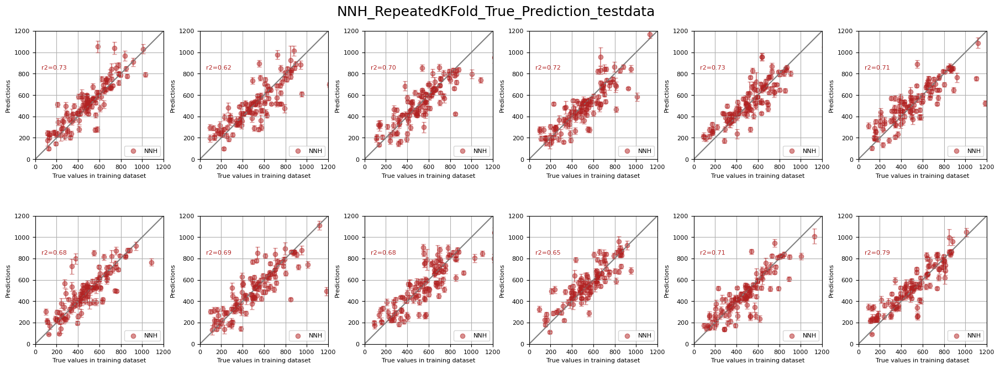

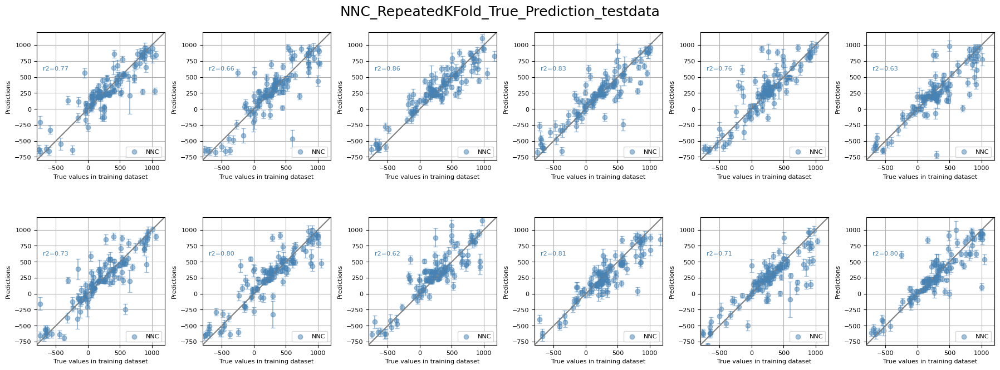

In [ ]:
if Flag_Evaluation:

    from utils.postprocessing_evalutation import predict_bootstrap, plot_test_true_vs_pred

    NNH_model_name, NNC_model_name = 'NNH_model_mc_RepeatedKFold_{}.h5', 'NNC_model_mc_RepeatedKFold_{}.h5'
    k_folds, n_CVrepeats, mc_repeat = 6, 2, 50

    with concurrent.futures.ThreadPoolExecutor() as executor:
        future1 = executor.submit(predict_bootstrap, model_path_bo, NNH_model_name,
                                  X1_test_KFold, [], V1_test_KFold,
                                  k_folds, n_CVrepeats, mc_repeat,
                                  scalers["compo"], [], scalers["specific_features"], scalers["H_output"])

        future2 = executor.submit(predict_bootstrap, model_path_bo, NNC_model_name,
                                  X2_test_KFold, Z2_test_KFold, W2_test_KFold,
                                  k_folds, n_CVrepeats, mc_repeat,
                                  scalers["compo"], scalers["C_specific_testing"], scalers["specific_features"], scalers["C_output"])

    H1_test_pred_X1_stack, H1_test_pred_X1_mean, H1_test_pred_X1_std = future1.result()
    C2_test_pred_X2_stack, C2_test_pred_X2_mean, C2_test_pred_X2_std = future2.result()

    plot_test_true_vs_pred(k_folds, n_CVrepeats, H1_test_KFold, H1_test_pred_X1_mean, H1_test_pred_X1_std,
                           [0, 1200], 'NNH', 'firebrick', model_path_bo)

    plot_test_true_vs_pred(k_folds, n_CVrepeats, C2_test_KFold, C2_test_pred_X2_mean, C2_test_pred_X2_std,
                           [-800, 1200], 'NNC', 'steelblue', model_path_bo)

### Plot true vs predictions (full dataset) including all model ensembles


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

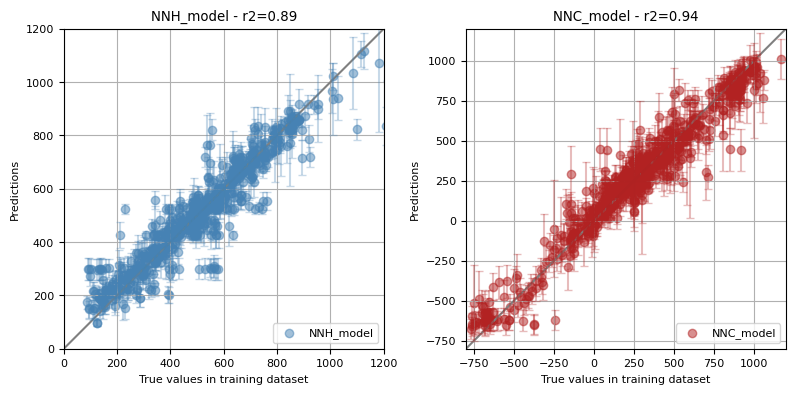

In [ ]:
if Flag_Evaluation:

    from utils.postprocessing_evalutation import predict_bootstrap, plot_full_true_vs_pred

    X1_list, Y1_list, V1_list = [X1]*k_folds * \
        n_CVrepeats, [], [V1]*k_folds*n_CVrepeats
    X2_list, Z2_list, W2_list = [
        X2]*k_folds*n_CVrepeats, [Z2]*k_folds*n_CVrepeats, [W2]*k_folds*n_CVrepeats

    with concurrent.futures.ThreadPoolExecutor() as executor:
        future1 = executor.submit(predict_bootstrap, model_path_bo, NNH_model_name,
                                  X1_list, Y1_list, V1_list,
                                  k_folds, n_CVrepeats, mc_repeat,
                                  scalers["compo"], [], scalers["specific_features"], scalers["H_output"])

        future2 = executor.submit(predict_bootstrap, model_path_bo, NNC_model_name,
                                  X2_list, Z2_list, W2_list,
                                  k_folds, n_CVrepeats, mc_repeat,
                                  scalers["compo"], scalers["C_specific_testing"], scalers["specific_features"], scalers["C_output"])

    H1_pred_X1_stack, H1_pred_X1_mean, H1_pred_X1_std = future1.result()
    C2_pred_X2_stack, C2_pred_X2_mean, C2_pred_X2_std = future2.result()

    plot_full_true_vs_pred([H1, C2], [H1_pred_X1_stack, C2_pred_X2_stack],
                           model_path_bo, lims=[[0, 1200], [-800, 1200]])

## Predict based on new data inputs


### Coordinates for PVD alloy representation


In [ ]:
if Flag_Prediction:
    # load the wafer-coordinates
    df_PVD_x_y = pd.read_excel(data_path + 'PVD_x_y.xlsx')
    coord_x = df_PVD_x_y["x"].to_numpy(dtype=float)
    coord_y = df_PVD_x_y["y"].to_numpy(dtype=float)
    index_PVD_x_y = df_PVD_x_y.index.values+1

### Make predictions for new alloys

- NiCrCoVFe_KW99
- NiCrMoTiFe_KW131


Processing:   0%|          | 0/2 [00:00<?, ?it/s]

['Ni', 'Cr', 'Co', 'V', 'Fe']
NiCrCoVFe_KW99


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

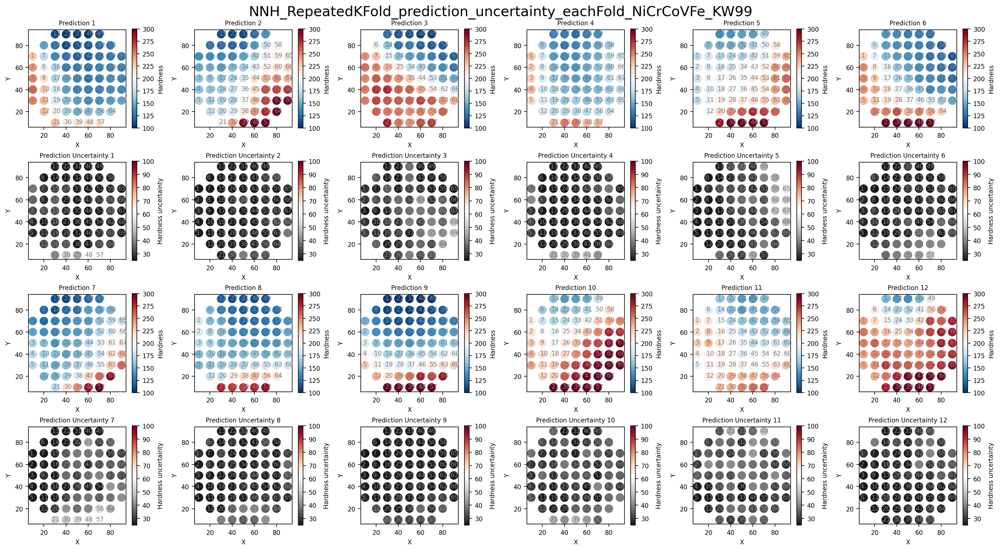

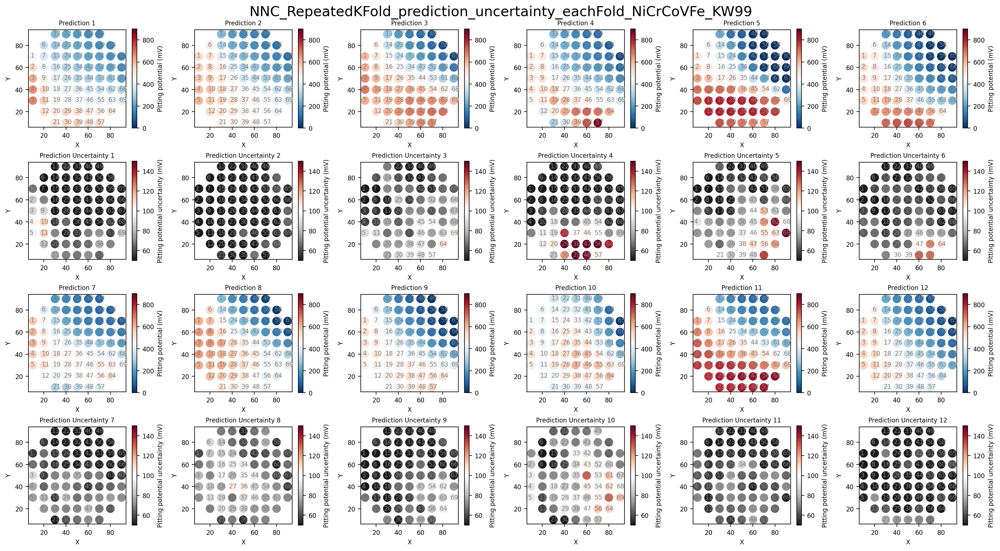

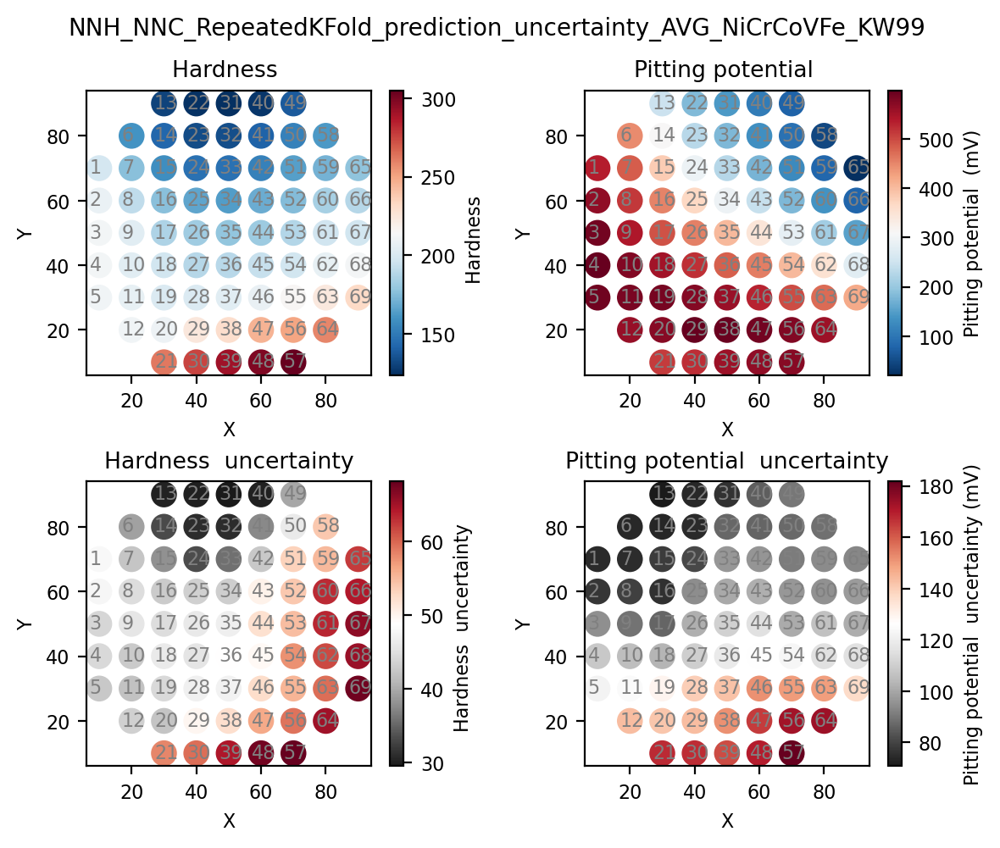

Processing:  50%|█████     | 1/2 [00:52<00:52, 52.02s/it]

['Ni', 'Cr', 'Mo', 'Ti', 'Fe']
NiCrMoTiFe_KW131


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'NoneType' object has no attribute '__dict__'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosi

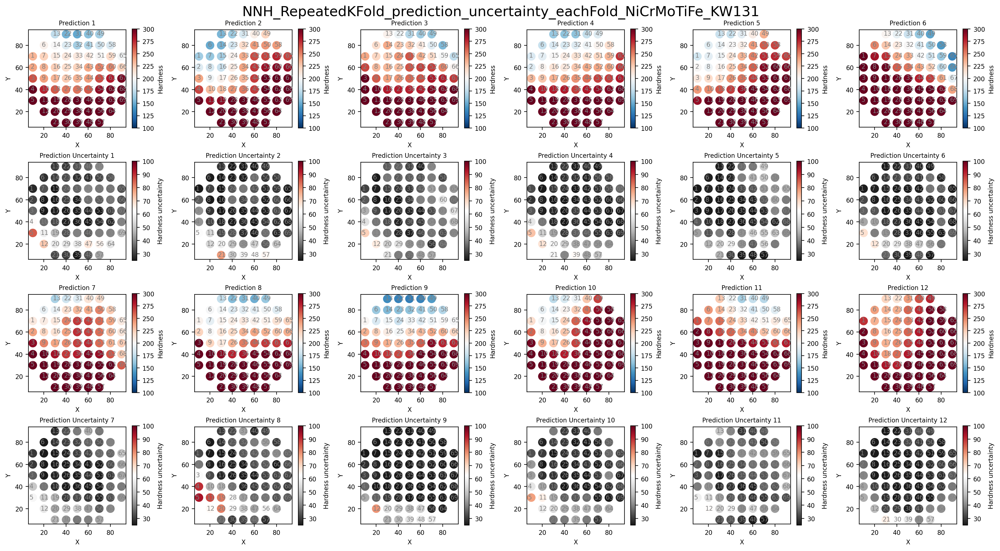

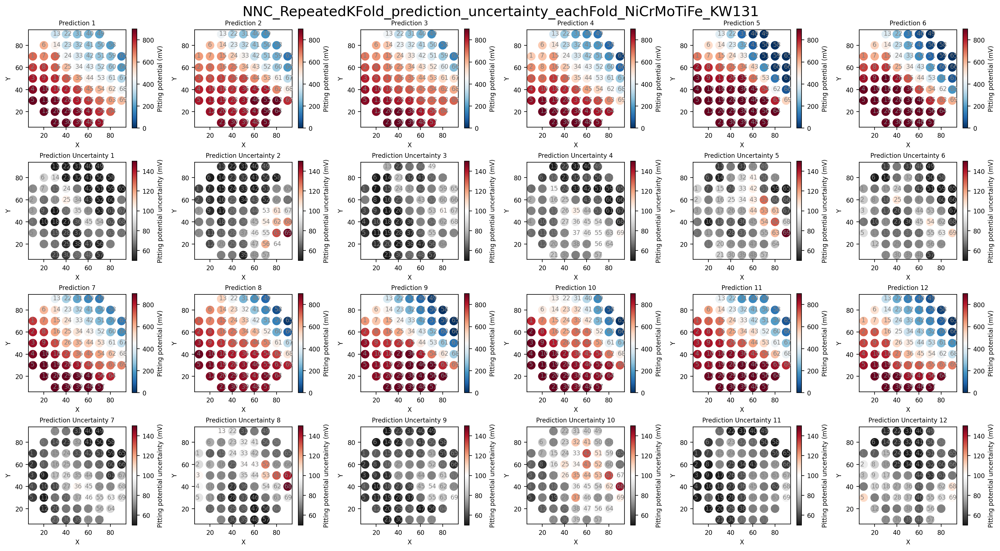

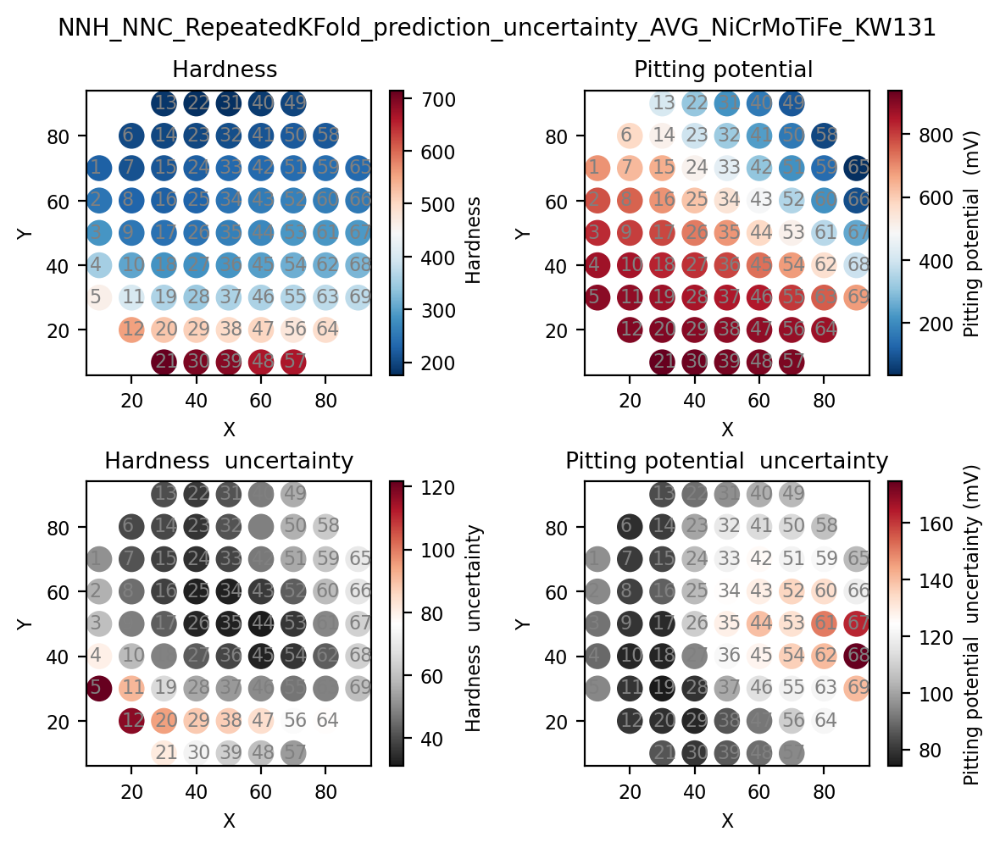

Processing: 100%|██████████| 2/2 [01:46<00:00, 53.15s/it]


In [ ]:
if Flag_Prediction:

    from utils.postprocessing_prediction import read_new_data_feature_calc, predict_bootstrap_NNH_NNC, plot_prediction_uncertainty, plot_prediction_uncertainty_AVG
    from tqdm import tqdm

    compo_A_B_C_D_E_list = [
        ['Ni', 'Cr', 'Co', 'V', 'Fe'], ['Ni', 'Cr', 'Mo', 'Ti', 'Fe']]
    compo_A_B_C_D_E_fname_list = ['NiCrCoVFe_KW99', 'NiCrMoTiFe_KW131']

    for compo_A_B_C_D_E, compo_A_B_C_D_E_fname in tqdm(zip(compo_A_B_C_D_E_list, compo_A_B_C_D_E_fname_list), desc='Processing', total=len(compo_A_B_C_D_E_list)):

        print(compo_A_B_C_D_E)
        print(compo_A_B_C_D_E_fname)

        vars_ele = compo_A_B_C_D_E
        KW_name = compo_A_B_C_D_E_fname
        file_name_input = f'{data_path}MultiTaskModel_{KW_name}_wt_pct.xlsx'
        df_new_wt = pd.read_excel(file_name_input)

        compo_new, HC_specific_features, C_specific_testing = read_new_data_feature_calc(df_new_wt, vars_ele,
                                                                                         specific_features_sel_column=['delta_a', 'Tm', 'sigma_Tm',
                                                                                                                       'Hmix', 'sigma_Hmix', 'sigma_elec_nega', 'VEC', 'sigma_VEC'],
                                                                                         C_testing=np.array([25, 1, 7, 0.333]))

        NNH_model_name = 'NNH_model_mc_RepeatedKFold_{}.h5'
        NNC_model_name = 'NNC_model_mc_RepeatedKFold_{}.h5'
        k_folds, n_CVrepeats, mc_repeat = 6, 2, 50

        (H1_new_pred_stack, H1_new_pred_mean, H1_new_pred_std,
         C2_new_pred_stack, C2_new_pred_mean, C2_new_pred_std) = predict_bootstrap_NNH_NNC(
            model_path_bo, NNH_model_name, NNC_model_name,
            compo_new, HC_specific_features, C_specific_testing,
            scalers, k_folds, n_CVrepeats, mc_repeat)

        # Concatenate and compute mean and std + save to excel
        H1_new_pred_KFold_mean = np.mean(np.concatenate(
            H1_new_pred_stack, axis=0), axis=0).reshape(-1)
        H1_new_pred_KFold_std = np.std(np.concatenate(
            H1_new_pred_stack, axis=0), axis=0).reshape(-1)
        C2_new_pred_KFold_mean = np.mean(np.concatenate(
            C2_new_pred_stack, axis=0), axis=0).reshape(-1)
        C2_new_pred_KFold_std = np.std(np.concatenate(
            C2_new_pred_stack, axis=0), axis=0).reshape(-1)

        df_new_wt['H1_new_pred_KFold_mean'] = H1_new_pred_KFold_mean
        df_new_wt['H1_new_pred_KFold_std'] = H1_new_pred_KFold_std
        df_new_wt['C2_new_pred_KFold_mean'] = C2_new_pred_KFold_mean
        df_new_wt['C2_new_pred_KFold_std'] = C2_new_pred_KFold_std

        file_name_output = f'{model_path_bo}MultiTaskModel_{KW_name}_wt_pct_ML.xlsx'
        df_new_wt.to_excel(file_name_output, index=False)

        # NNH predictions
        plot_prediction_uncertainty(model_path_bo, coord_x, coord_y, index_PVD_x_y, H1_new_pred_mean, H1_new_pred_std,
                                    pred_label='Hardness', unc_label='Hardness uncertainty',
                                    title='NNH_RepeatedKFold_prediction_uncertainty_eachFold_' + KW_name,
                                    vmin1=100, vmax1=300,
                                    vmin2=25, vmax2=100)

        # NNC predictions
        plot_prediction_uncertainty(model_path_bo, coord_x, coord_y, index_PVD_x_y, C2_new_pred_mean, C2_new_pred_std,
                                    pred_label='Pitting potential (mV)', unc_label='Pitting potential uncertainty (mV)',
                                    title='NNC_RepeatedKFold_prediction_uncertainty_eachFold_' + KW_name,
                                    vmin1=0, vmax1=900,
                                    vmin2=50, vmax2=150)

        # NNH_NNC_AVG predictions
        plot_prediction_uncertainty_AVG(model_path_bo, coord_x, coord_y, index_PVD_x_y, H1_new_pred_stack, C2_new_pred_stack,
                                        title='NNH_NNC_RepeatedKFold_prediction_uncertainty_AVG_' + KW_name)


## Local Explanation by SHAP


### data import and processing for new data


In [ ]:
compo_A_B_C_D_E_list = [['Ni', 'Cr', 'Co', 'V', 'Fe'],
                        ['Ni', 'Cr', 'Mo', 'Ti', 'Fe']]
compo_A_B_C_D_E_fname_list = ['NiCrCoVFe_KW99', 'NiCrMoTiFe_KW131']

for compo_A_B_C_D_E, compo_A_B_C_D_E_fname in tqdm(zip(compo_A_B_C_D_E_list, compo_A_B_C_D_E_fname_list), desc='Processing', total=len(compo_A_B_C_D_E_list)):

    print(compo_A_B_C_D_E)
    print(compo_A_B_C_D_E_fname)

    vars_ele = compo_A_B_C_D_E
    KW_name = compo_A_B_C_D_E_fname
    file_name_input = f'{data_path}MultiTaskModel_{KW_name}_wt_pct.xlsx'
    df_new_wt = pd.read_excel(file_name_input)

    compo_new, HC_specific_features, C_specific_testing = read_new_data_feature_calc(df_new_wt, vars_ele,
                                                                                     specific_features_sel_column=['delta_a', 'Tm', 'sigma_Tm',
                                                                                                                   'Hmix', 'sigma_Hmix', 'sigma_elec_nega', 'VEC', 'sigma_VEC'],
                                                                                     C_testing=np.array([25, 1, 7, 0.333]))

    if KW_name == 'NiCrCoVFe_KW99':
        KW99_compo, KW99_features, KW99_testing = compo_new, HC_specific_features, C_specific_testing
    elif KW_name == 'NiCrMoTiFe_KW131':
        KW131_compo, KW131_features, KW131_testing = compo_new, HC_specific_features, C_specific_testing

index_KW99_FCC = [x for x in list(range(0, 64)) if x not in [
    20, 29, 38, 47, 56]]
index_KW131_FCC = [0, 1, 5, 6, 7, 8, 12, 13, 14, 15, 16, 17, 21, 22, 23, 24, 25, 26,
                   30, 31, 32, 33, 34, 35, 39, 40, 41, 42, 43, 44, 48, 49, 50, 51, 52, 53, 54]

# for hardness model
X1_all = np.vstack((KW131_compo[index_KW131_FCC, :]))
Y1_all = np.empty(0)
V1_all = np.vstack((KW131_features[index_KW131_FCC, :]))

# for corrosion model
X2_all = np.vstack((KW131_compo[index_KW131_FCC, :]))
Z2_all = np.vstack((KW131_testing[index_KW131_FCC, :]))
W2_all = np.vstack((KW131_features[index_KW131_FCC, :]))

print(X1.shape, KW99_compo.shape, KW131_compo.shape)


Processing:   0%|          | 0/2 [00:00<?, ?it/s]

['Ni', 'Cr', 'Co', 'V', 'Fe']
NiCrCoVFe_KW99


Processing:  50%|█████     | 1/2 [00:00<00:00,  3.58it/s]

['Ni', 'Cr', 'Mo', 'Ti', 'Fe']
NiCrMoTiFe_KW131


Processing: 100%|██████████| 2/2 [00:00<00:00,  3.80it/s]

(680, 20) (69, 20) (69, 20)


### model prediction and SHAP analysis


In [ ]:
from utils.postprocessing_evalutation import predict_norm_shap_bootstrap

NNH_model_name, NNC_model_name = 'NNH_model_RepeatedKFold_{}.h5', 'NNC_model_RepeatedKFold_{}.h5'
k_folds, n_CVrepeats, mc_repeat = 6, 2, 1

# for hardness dataset
X1_all_list, Y1_all_list, V1_all_list = [X1_all]*k_folds * \
    n_CVrepeats, [], [V1_all]*k_folds*n_CVrepeats

# for corrosion dataset
X2_all_list, Z2_all_list, W2_all_list = [
    X2_all]*k_folds*n_CVrepeats, [Z2_all]*k_folds*n_CVrepeats, [W2_all]*k_folds*n_CVrepeats

with concurrent.futures.ThreadPoolExecutor() as executor:
    future1 = executor.submit(predict_norm_shap_bootstrap, model_path_bo, NNH_model_name,
                              X1_all_list, Y1_all_list, V1_all_list,
                              k_folds, n_CVrepeats, mc_repeat,
                              scalers["compo"], [], scalers["specific_features"])

    future2 = executor.submit(predict_norm_shap_bootstrap, model_path_bo, NNC_model_name,
                              X2_all_list, Z2_all_list, W2_all_list,
                              k_folds, n_CVrepeats, mc_repeat,
                              scalers["compo"], scalers["C_specific_testing"], scalers["specific_features"])

H1_pred_norm_X1_all_stack, _, _, H1_shap_X1_all_stack = future1.result()
C2_pred_norm_X2_all_stack, _, _, C2_shap_X2_all_stack = future2.result()


2023-08-23 21:39:49.471465: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-23 21:39:49.471478: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-23 21:39:49.471510: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the ap

In [ ]:
print(H1_shap_X1_all_stack[0].shape)
print(C2_shap_X2_all_stack[0].shape)

(37, 28)
(37, 32)


In [ ]:
def process_predict_norm_shap_data(pred_norm_stack, shap_stack):
    pred_norm_conc = np.concatenate(pred_norm_stack, axis=0)
    pred_norm_mean = np.mean(pred_norm_conc, axis=0).reshape(-1)
    pred_norm_std = np.std(pred_norm_conc, axis=0).reshape(-1)

    shap_mean = np.mean(shap_stack, axis=0)
    shap_std = np.std(shap_stack, axis=0)

    return pred_norm_mean, pred_norm_std, shap_mean, shap_std


H1_pred_norm_X1_all_KFold_mean, _, H1_shap_X1_all_KFold_mean, _ = process_predict_norm_shap_data(
    H1_pred_norm_X1_all_stack, H1_shap_X1_all_stack)

print(H1_pred_norm_X1_all_KFold_mean.shape)
print(H1_shap_X1_all_KFold_mean.shape)

C2_pred_norm_X2_all_KFold_mean, _, C2_shap_X2_all_KFold_mean, _ = process_predict_norm_shap_data(
    C2_pred_norm_X2_all_stack, C2_shap_X2_all_stack)

print(C2_pred_norm_X2_all_KFold_mean.shape)
print(C2_shap_X2_all_KFold_mean.shape)


(37,)
(37, 28)
(37,)
(37, 32)


,Fe,Cr,Ni,Mo,W,N,Nb,C,Si,Mn,...,Zr,Hf,delta_a,Tm,sigma_Tm,Hmix,sigma_Hmix,sigma_elec_nega,VEC,sigma_VEC
0,14.316994,35.210247,45.453038,4.138939,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.022535,1943.689937,257.662231,-6.600671,2.725195,0.129477,8.019565,1.882783


Pred calculated from model: 0.11974084


,Fe,Cr,Ni,Mo,W,N,Nb,C,Si,Mn,...,Zr,Hf,delta_a,Tm,sigma_Tm,Hmix,sigma_Hmix,sigma_elec_nega,VEC,sigma_VEC
0,-0.017229,-0.00396,-0.001252,-0.000823,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.003591,0.000025,0.000624,0.001437,-0.000787,0.003968,0.004993,0.005229


Validate the pred calculated using SHAP values: 0.11974085343746471


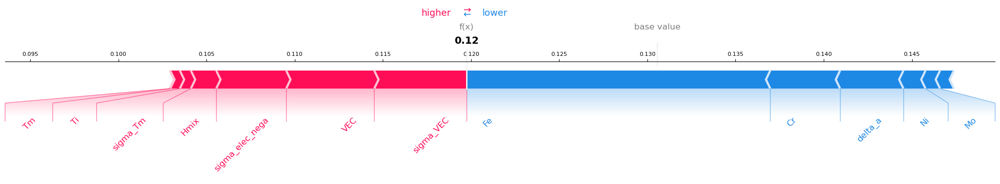

,Fe,Cr,Ni,Mo,W,N,Nb,C,Si,Mn,...,pH,ScanRate_mVs,delta_a,Tm,sigma_Tm,Hmix,sigma_Hmix,sigma_elec_nega,VEC,sigma_VEC
0,14.316994,35.210247,45.453038,4.138939,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,0.333,0.022535,1943.689937,257.662231,-6.600671,2.725195,0.129477,8.019565,1.882783


Pred calculated from model: 0.6035988


,Fe,Cr,Ni,Mo,W,N,Nb,C,Si,Mn,...,pH,ScanRate_mVs,delta_a,Tm,sigma_Tm,Hmix,sigma_Hmix,sigma_elec_nega,VEC,sigma_VEC
0,-0.02364,0.022401,-0.001008,0.002379,0.0,0.0,0.0,0.0,0.0,0.0,...,0.005148,0.000642,-0.002176,0.003832,0.001537,0.001329,0.0,0.0,0.0,0.0


Validate the pred calculated using SHAP values: 0.5754491915369351


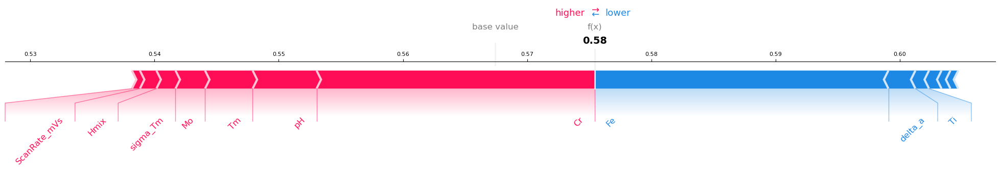

In [ ]:
import shap
import pandas as pd
import numpy as np


def plot_shap_force(X1, Y1, V1,
                    compo_column, C_specific_testing_column, specific_features_sel_column,
                    pred_norm_KFold_mean, shap_KFold_mean,
                    sample_dataset, sample_index=1):
    """
    Plots a SHAP force plot for a specific sample from the dataset.
    """
    shap.initjs()

    # Adjust for 0-indexing
    sample_index -= 1
    columns = compo_column + \
        (C_specific_testing_column if Y1.size > 0 else []) + \
        specific_features_sel_column

    # Display sample features
    sample_feature_values = sample_dataset[sample_index, :]
    sample_feature_values_df = pd.DataFrame(
        data=[sample_feature_values], columns=columns)
    display(sample_feature_values_df)

    print('Pred calculated from model:', pred_norm_KFold_mean[sample_index])

    # Display SHAP values for the sample
    sample_shap_values = shap_KFold_mean[sample_index, :].reshape(-1)
    sample_shap_values_df = pd.DataFrame(
        data=[sample_shap_values], columns=columns)
    display(sample_shap_values_df)

    # Validate the predicted value for the selected sample
    pred_norm_KFold_mean_base = pred_norm_KFold_mean.mean()
    predicted_value_sample = pred_norm_KFold_mean_base + sample_shap_values.sum()
    print('Validate the pred calculated using SHAP values:', predicted_value_sample)

    # Visualize SHAP force plot
    shap.force_plot(
        pred_norm_KFold_mean_base,
        sample_shap_values,
        columns,
        link='identity',
        matplotlib=True,
        figsize=(25, 3),
        text_rotation=45,
        contribution_threshold=0.000
    )


# Example usage:
sample_dataset = np.hstack((X1_all, V1_all))
plot_shap_force(X1_all, Y1_all, V1_all,
                compo_column, C_specific_testing_column, specific_features_sel_column,
                H1_pred_norm_X1_all_KFold_mean, H1_shap_X1_all_KFold_mean,
                sample_dataset, sample_index=1)

sample_dataset = np.hstack((X2_all, Z2_all, W2_all))
plot_shap_force(X2_all, Z2_all, W2_all,
                compo_column, C_specific_testing_column, specific_features_sel_column,
                C2_pred_norm_X2_all_KFold_mean, C2_shap_X2_all_KFold_mean,
                sample_dataset, sample_index=1)

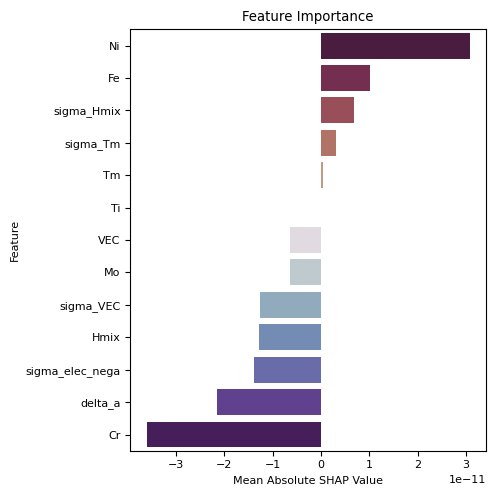

In [ ]:
# Calculate the mean absolute SHAP values for each feature. This gives a measure of the average impact
# each feature has on predictions across all instances.
# mean_shap_values = np.abs(H1_shap_X1_all_KFold_mean.mean(axis=0))
mean_shap_values = H1_shap_X1_all_KFold_mean.mean(axis=0)

# Organize the calculated SHAP values and their corresponding feature names into a DataFrame.
shap_df = pd.DataFrame(
    data={'SHAP Value': mean_shap_values, 'Feature': compo_column + specific_features_sel_column})

# Order the DataFrame based on the SHAP values to understand which features have the greatest influence.
shap_df = shap_df.sort_values(by='SHAP Value', ascending=False)
shap_df = shap_df[shap_df['SHAP Value'] != 0]

# Use Seaborn's barplot function to plot the data
plt.figure(figsize=(5, 5))
sns.barplot(x=shap_df['SHAP Value'], y=shap_df['Feature'],
            palette='twilight_shifted_r')
# Set the color palette for the plot
# sns.diverging_palette(220, 20, as_cmap=True)

plt.xlabel('Mean Absolute SHAP Value')
plt.title('Feature Importance')

# Adjust the plot to have the most important feature at the top for better readability.
# plt.gca().invert_yaxis()

# Ensure the plot layout is optimized to prevent overlapping or cutting off labels.
plt.tight_layout()

# Display the plotted chart.
plt.show()

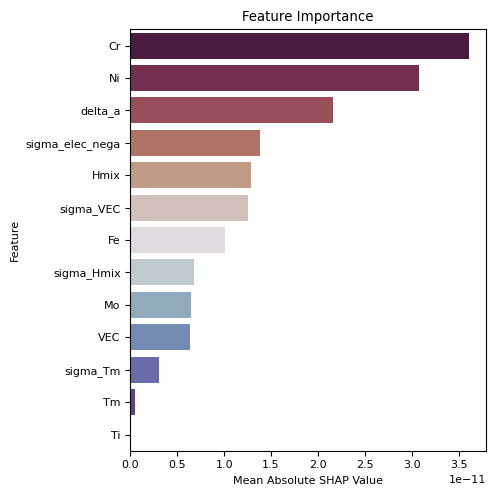

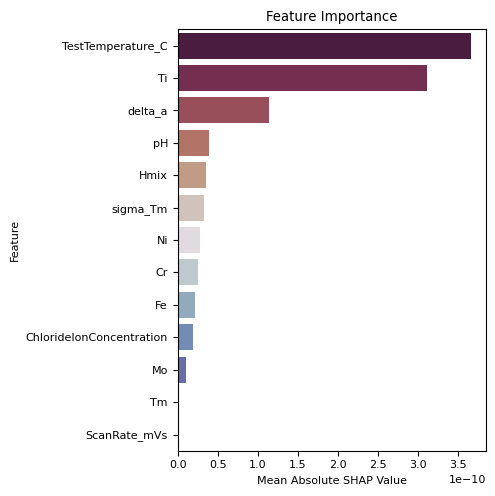

In [ ]:
def plot_shap_values(shap_KFold_mean, feature_names,
                     title='Feature Importance', figsize=(5, 5), palette='twilight_shifted_r'):
    """
    Plots the SHAP values in a descending order of importance.
    """
    shap_KFold_mean_avg = np.abs(shap_KFold_mean.mean(axis=0))
    # shap_KFold_mean_avg = shap_KFold_mean.mean(axis=0)

    # Organize the calculated SHAP values and their corresponding feature names into a DataFrame.
    shap_df = pd.DataFrame(
        data={'SHAP Value': shap_KFold_mean_avg, 'Feature': feature_names})

    # Order the DataFrame based on the SHAP values to understand which features have the greatest influence.
    shap_df = shap_df.sort_values(by='SHAP Value', ascending=False)
    shap_df = shap_df[shap_df['SHAP Value'] != 0]

    # Use Seaborn's barplot function to plot the data
    plt.figure(figsize=figsize)
    sns.barplot(x=shap_df['SHAP Value'], y=shap_df['Feature'], palette=palette)

    plt.xlabel('Mean Absolute SHAP Value')
    plt.title(title)

    # Ensure the plot layout is optimized to prevent overlapping or cutting off labels.
    plt.tight_layout()

    # Display the plotted chart.
    plt.show()


# Usage example:
plot_shap_values(H1_shap_X1_all_KFold_mean, compo_column + specific_features_sel_column,
                 title='Feature Importance', figsize=(5, 5), palette='twilight_shifted_r')

plot_shap_values(C2_shap_X2_all_KFold_mean, compo_column + C_specific_testing_column + specific_features_sel_column,
                 title='Feature Importance', figsize=(5, 5), palette='twilight_shifted_r')